In [5]:
"""
Experiment GTCRN_SS: GTCRN-based Spectral Subtraction Comparison

This experiment evaluates the performance of GTCRN-based spectral subtraction
using multiple spectral representations in a generic, extensible way.
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import warnings

# Define paths
repo_root = Path.cwd().parent.parent.parent.parent

# Set global plot parameters
plt.rcParams['figure.dpi'] = 400
plt.rcParams['font.size'] = 18
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams['axes.labelsize'] = 18
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18
plt.rcParams['legend.fontsize'] = 18


In [6]:
# ============================================================================
# CONFIGURATION SECTION - Add/Remove systems here
# ============================================================================
SYSTEMS_CONFIG = {
    'Baseline': {
        'directory': repo_root / "results" / "EXP3" / "spectral" / "Optimal_hybrid_car" /"BASELINE",
        'file_pattern': "GTCRN_SS_TEST2_[{snr}]dB.csv",
        'color': "#d62728",
        'marker': 'o',
        'linestyle': '-',
        'linewidth': 2.5
    },
    # 'GTCRN': {
    #     'directory': repo_root / "results" / "EXP3" / "GTCRN" / "GTCRN_EXP3p2a",
    #     'file_pattern': "GTCRN_EXP3p2a_merged_[{snr}]dB.csv",
    #     'color': '#D55E00',
    #     'marker': 'D',
    #     'linestyle': ':',
    #     'linewidth': 2.5
    # },

        'GTCRN': {
        'directory': repo_root / "results" / "EXP3" / "spectral" / "Optimal_hybrid_car" /"GTCRN",
        'file_pattern': "GTCRN_SS_TEST2_[{snr}]dB.csv",
        'color': "#00A7D5",
        'marker': 'D',
        'linestyle': '-',
        'linewidth': 2.5
    },

    # Note DNSMOS 2
    'GTCRN_SS DNSMOS': {
        'directory': repo_root / "results" / "EXP3" / "spectral" / "Optimal_hybrid_car" /"DNSMOS2" /"log_25ms_ov50_fl07_N8",
        'file_pattern': "GTCRN_SS_TEST2_[{snr}]dB.csv",
        'color': '#ff7f0e',
        'marker': 's',
        'linestyle': '-',
        'linewidth': 2.5
    },
    # Note PESQ 2
    # 'GTCRN_SS PESQ': {
    #     'directory': repo_root / "results" / "EXP3" / "spectral" / "Optimal_hybrid_car" /"PESQ2" / "log_8ms_ov75_fl08_N16",
    #     'file_pattern': "GTCRN_SS_TEST2_[{snr}]dB.csv",
    #     'color': '#2ca02c',
    #     'marker': '^',
    #     'linestyle': '-',
    #     'linewidth': 2.5
    # },
   
    'GTCRN_SS SI_SDR': {
        'directory': repo_root / "results" / "EXP3" / "spectral" / "Optimal_hybrid_car" /"SI_SDR" /"log_20ms_ov75_fl07_N4",
        'file_pattern': "GTCRN_SS_TEST2_[{snr}]dB.csv",
        'color': '#9467bd',
        'marker': 'v',
        'linestyle': '-',
        'linewidth': 2.5
    },

    # 'GTCRN_SS STOI': {
    #     'directory': repo_root / "results" / "EXP3" / "spectral" / "Optimal_hybrid_car" /"STOI" /"log_20ms_ov75_fl08_N16",
    #     'file_pattern': "GTCRN_SS_TEST2_[{snr}]dB.csv",
    #     'color': "#39da6c",
    #     'marker': 'x',
    #     'linestyle': ':',
    #     'linewidth': 2.5
    # },

    
    # 'GTCRN_SS STOI2': {
    #     'directory': repo_root / "results" / "EXP3" / "spectral" / "Optimal_hybrid_car" /"STOI" /"lin_8ms_ov75_fl07_N8",
    #     'file_pattern': "GTCRN_SS_TEST2_[{snr}]dB.csv",
    #     'color': "#da395e",
    #     'marker': 'x',
    #     'linestyle': ':',
    #     'linewidth': 2.5
    # },
}



In [7]:
# Create output directory
output_dir = repo_root / 'DATA_ANALYSIS' / 'SS' / 'GTCRN_SS_hybrid' / 'GTCRN_SS_comparison'
output_dir.mkdir(parents=True, exist_ok=True)

# SNR levels and metrics
snr_levels = [-5, 0, 5, 10, 15]
metrics = ['PESQ', 'SI_SDR', 'STOI', 'DNSMOS_p808_mos']

# ============================================================================
# GENERIC FUNCTIONS
# ============================================================================

def parse_system_csv(system_name: str, snr: int) -> pd.DataFrame:
    """
    Generic parser for any system's CSV by SNR.
    
    Args:
        system_name (str): Name of the system from SYSTEMS_CONFIG
        snr (int): SNR value (-5, 0, 5, 10, 15)
    
    Returns:
        pd.DataFrame: Grouped by noise_type with mean metrics
    """
    config = SYSTEMS_CONFIG[system_name]
    file_path = config['directory'] / config['file_pattern'].format(snr=snr)
    df = pd.read_csv(file_path)
    
    # Extract noise type from enhanced_file
    df['noise_type'] = df['enhanced_file'].str.extract(r'NOIZEUS_NOISE_DATASET_(.*?)_SNR')
    
    # Group by noise_type and compute mean of numeric columns
    grouped = df.groupby('noise_type').mean(numeric_only=True)
    
    return grouped


def check_directories():
    """Check that all configured directories exist."""
    print("Checking directory structure...")
    print("="*80)
    
    all_exist = True
    for name, config in SYSTEMS_CONFIG.items():
        directory = config['directory']
        if not directory.exists():
            print(f"❌ {name}: NOT FOUND - {directory}")
            all_exist = False
        else:
            files = list(directory.glob("*.csv"))
            print(f"✓ {name}: Found {len(files)} CSV files")
    
    print(f"\n✓ Output directory: {output_dir}")
    print("="*80)
    
    if not all_exist:
        raise FileNotFoundError("Some directories not found. Check paths in SYSTEMS_CONFIG.")


def load_all_data():
    """Load data for all systems and SNR levels."""
    print("\nLoading comparison data...")
    
    comparison_data = {metric: {snr: {} for snr in snr_levels} for metric in metrics}
    
    for snr in snr_levels:
        for system_name in SYSTEMS_CONFIG.keys():
            system_df = parse_system_csv(system_name, snr)
            
            for metric in metrics:
                comparison_data[metric][snr][system_name] = system_df[metric].mean()
    
    # Convert to DataFrames
    comparison_dfs = {}
    for metric in metrics:
        df = pd.DataFrame(comparison_data[metric]).T
        df.index.name = 'SNR (dB)'
        comparison_dfs[metric] = df
    
    print("✓ Data loaded successfully!")
    print("\nPESQ Comparison Preview:")
    print(comparison_dfs['PESQ'].round(4))
    
    return comparison_dfs


def plot_performance_comparison(comparison_dfs):
    """Generate comprehensive comparison plots."""
    print("\nGenerating performance comparison plots...")
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.flatten()
    
    for idx, metric in enumerate(metrics):
        ax = axes[idx]
        df = comparison_dfs[metric]
        
        for system_name, config in SYSTEMS_CONFIG.items():
            ax.plot(df.index, df[system_name], 
                    marker=config['marker'], 
                    color=config['color'],
                    linestyle=config['linestyle'],
                    linewidth=config['linewidth'], 
                    markersize=10,
                    label=system_name)
        
        ax.set_xlabel('SNR (dB)', fontweight='bold')
        ax.set_ylabel(metric, fontweight='bold')
        ax.set_title(f'{metric}', fontweight='bold', pad=18)
        ax.grid(True, alpha=0.3, linestyle='--')
        #
        ax.legend(loc='upper left', framealpha=0.9, fontsize=18)
        ax.set_xticks(snr_levels)
    
    plt.tight_layout()
    plt.savefig(output_dir / 'GTCRN_SS_comparison_all_metrics.png', 
                dpi=400, bbox_inches='tight')
    plt.savefig(output_dir / 'GTCRN_SS_comparison_all_metrics.svg',
                format='svg', bbox_inches='tight')
    plt.show()
    
    print("✓ Comparison plots saved!")


def calculate_improvements(comparison_dfs, baseline_name='Baseline'):
    """Calculate improvements over baseline for all systems."""
    print("\nCalculating improvements...")
    
    improvements = {}
    
    for system_name in SYSTEMS_CONFIG.keys():
        if system_name == baseline_name:
            continue
        
        improvements[system_name] = {}
        for metric in metrics:
            df = comparison_dfs[metric]
            improvements[system_name][metric] = (
                (df[system_name] - df[baseline_name]) / df[baseline_name] * 100
            ).round(2)
    
    # Create summary table
    improvement_summary = pd.DataFrame({'SNR (dB)': snr_levels})
    
    for system_name, system_improvements in improvements.items():
        for metric in metrics:
            col_name = f'{metric} {system_name} vs {baseline_name} (%)'
            improvement_summary[col_name] = system_improvements[metric].values
    
    improvement_summary = improvement_summary.set_index('SNR (dB)')
    
    print("\nImprovement Summary (%):")
    print("="*100)
    print(improvement_summary.round(2))
    
    # Export
    improvement_summary.to_csv(output_dir / 'improvement_summary.csv')
    print("\n✓ Improvement summary exported")
    
    return improvements


def plot_per_noise_type(snr_subset=[-5, 0, 5], metric_name='PESQ'):
    """Generate per-noise type comparison plots. Lightly highlight in green 
    if any of the hybrid configuration outperforms others"""
    print(f"\nAnalyzing {metric_name} performance by noise type...")
    
    # Collect data
    noise_data = {}
    hybrid_systems = ['GTCRN_SS DNSMOS', 'GTCRN_SS SI_SDR']
    for snr in snr_subset:
        for system_name in SYSTEMS_CONFIG.keys():
            system_by_noise = parse_system_csv(system_name, snr)
            
            for noise_type in system_by_noise.index:
                if noise_type not in noise_data:
                    noise_data[noise_type] = {s: {} for s in SYSTEMS_CONFIG.keys()}
                
                noise_data[noise_type][system_name][snr] = system_by_noise.loc[noise_type, metric_name]
    
    # Plot
    noise_types = sorted(noise_data.keys())
    x_pos = np.arange(len(noise_types))
    
    for snr in snr_subset:
        fig, ax = plt.subplots(figsize=(16, 8))
        
        for system_name, config in SYSTEMS_CONFIG.items():
            values = [noise_data[noise_type][system_name][snr] for noise_type in noise_types]
            
            ax.plot(x_pos, values,
                    label=system_name,
                    color=config['color'],
                    marker=config['marker'],
                    linestyle='None',
                    linewidth=config['linewidth'],
                    markersize=8,
                    alpha=0.85)
            
        # Highlight hybrid systems outperforming GTCRN
        for noise_idx, noise_type in enumerate(noise_types):
            gtcrn_value = noise_data[noise_type]['GTCRN'][snr]
            for hybrid_system in hybrid_systems:
                hybrid_value = noise_data[noise_type][hybrid_system][snr]
                if hybrid_value > gtcrn_value:
                    ax.axvspan(noise_idx - 0.5, noise_idx + 0.5, color='green', alpha=0.2)
        
        ax.set_xlabel('Noise Type', fontweight='bold')
        ax.set_ylabel(metric_name, fontweight='bold')
        ax.set_title(f'{metric_name} by Noise Type at SNR = {snr} dB', 
                     fontweight='bold', pad=20)
        ax.set_xticks(x_pos)
        ax.set_xticklabels(noise_types, rotation=45, ha='right')
        ax.legend(loc='upper left', bbox_to_anchor=(1.02, 1), framealpha=0.95, fontsize=16)
        ax.grid(True, alpha=0.4, linestyle='--', linewidth=0.8)
        ax.set_axisbelow(True)
        
        plt.tight_layout()
        
        filename_png = f'GTCRN_SS_per_noise_SNR{snr}dB_{metric_name}_comparison.png'
        filename_svg = f'GTCRN_SS_per_noise_SNR{snr}dB_{metric_name}_comparison.svg'
        plt.savefig(output_dir / filename_png, dpi=400, bbox_inches='tight')
        plt.savefig(output_dir / filename_svg, format='svg', bbox_inches='tight')
        plt.show()
        
        print(f"✓ Saved: {filename_png}")
        
        # Export CSV
        csv_data = {'Noise_Type': noise_types}
        for system_name in SYSTEMS_CONFIG.keys():
            values = [noise_data[noise_type][system_name][snr] for noise_type in noise_types]
            csv_data[system_name.replace(' ', '_')] = values
        
        csv_df = pd.DataFrame(csv_data)
        csv_filename = f'GTCRN_SS_per_noise_SNR{snr}dB_{metric_name}_data.csv'
        csv_df.to_csv(output_dir / csv_filename, index=False, float_format='%.6f')

def plot_heatmaps(comparison_dfs):
    """Generate performance heatmaps for all metrics."""
    print("\nGenerating performance heatmaps...")
    
    fig, axes = plt.subplots(2, 2, figsize=(18, 14))
    axes = axes.flatten()
    
    for idx, metric in enumerate(metrics):
        ax = axes[idx]
        df = comparison_dfs[metric]
        
        sns.heatmap(df.T, annot=True, fmt='.3f', cmap='RdYlGn', 
                    ax=ax, cbar_kws={'label': metric},
                    linewidths=0.5, linecolor='black')
        
        ax.set_title(f'{metric} Performance Heatmap', fontweight='bold', pad=15)
        ax.set_xlabel('SNR (dB)', fontweight='bold')
        ax.set_ylabel('System', fontweight='bold')
    
    plt.tight_layout()
    plt.savefig(output_dir / 'GTCRN_SS_performance_heatmaps.png', 
                dpi=400, bbox_inches='tight')
    plt.savefig(output_dir / 'GTCRN_SS_performance_heatmaps.svg',
                format='svg', bbox_inches='tight')
    plt.show()
    
    print("✓ Heatmap visualization saved!")


def analyze_noise_type_benefits(snr_subset=[-5, 0, 5], reference_system='GTCRN'):
    """
    Calculate and display improvements for each noise type relative to a reference system.
    
    Args:
        snr_subset: List of SNR levels to analyze
        reference_system: Name of the reference system to compare against
    """
    print("\n" + "="*100)
    print(f"NOISE TYPE BENEFIT ANALYSIS (vs {reference_system})")
    print("="*100)
    
    # Get all system names except the reference
    comparison_systems = [s for s in SYSTEMS_CONFIG.keys() if s != reference_system]
    
    for snr in snr_subset:
        print(f"\n{'='*100}")
        print(f"SNR = {snr} dB - Noise Types Ranked by Improvement over {reference_system}")
        print(f"{'='*100}")
        
        # Load data for all systems
        system_data = {}
        for system_name in SYSTEMS_CONFIG.keys():
            system_data[system_name] = parse_system_csv(system_name, snr)
        
        reference_data = system_data[reference_system]
        
        # Calculate improvements for each configuration
        for config_name in comparison_systems:
            print(f"\n{config_name} Configuration:")
            print("-" * 100)
            
            config_data = system_data[config_name]
            
            for metric in metrics:
                improvement_by_noise = {}
                for noise_type in reference_data.index:
                    ref_val = reference_data.loc[noise_type, metric]
                    config_val = config_data.loc[noise_type, metric]
                    improvement = ((config_val - ref_val) / ref_val * 100)
                    improvement_by_noise[noise_type] = improvement
                
                # Sort by improvement (descending)
                sorted_noise = sorted(improvement_by_noise.items(), key=lambda x: x[1], reverse=True)
                
                print(f"\n  {metric}:")
                for rank, (noise, imp) in enumerate(sorted_noise, 1):
                    print(f"    {rank}. {noise:20s}: {imp:+7.2f}%")


def print_statistical_summary(comparison_dfs, reference_system='GTCRN'):
    """
    Print comprehensive statistical summary.
    
    Args:
        comparison_dfs: Dictionary of comparison dataframes
        reference_system: Name of the reference system for improvement calculations
    """
    print("\n" + "="*100)
    print("EXPERIMENT GTCRN_SS: STATISTICAL SUMMARY")
    print("="*100)
    
    # Overall performance across all SNRs
    print("\nOVERALL PERFORMANCE SUMMARY (Average across all SNR levels):")
    print("-"*100)
    overall_summary = pd.DataFrame({'Metric': metrics})
    
    for system_name in SYSTEMS_CONFIG.keys():
        overall_summary[system_name] = [comparison_dfs[m][system_name].mean() for m in metrics]
    
    overall_summary = overall_summary.set_index('Metric')
    print(overall_summary.round(4))
    
    # Export overall summary
    overall_summary.to_csv(output_dir / 'overall_summary.csv')
    print("\n✓ Overall summary exported")
    
    # Calculate average improvements over reference system
    if reference_system in SYSTEMS_CONFIG:
        print(f"\nAVERAGE IMPROVEMENT OVER {reference_system} (%):")
        print("-"*100)
        
        improvement_cols = {'Metric': metrics}
        for system_name in SYSTEMS_CONFIG.keys():
            if system_name != reference_system:
                col_name = f'{system_name} vs {reference_system}'
                improvement_cols[col_name] = [
                    (comparison_dfs[m][system_name].mean() - comparison_dfs[m][reference_system].mean()) / 
                    comparison_dfs[m][reference_system].mean() * 100 
                    for m in metrics
                ]
        
        avg_improvement = pd.DataFrame(improvement_cols).set_index('Metric')
        print(avg_improvement.round(2))


def print_final_summary(comparison_dfs, reference_system='GTCRN'):
    """
    Print final experiment summary with key findings.
    
    Args:
        comparison_dfs: Dictionary of comparison dataframes
        reference_system: Name of the reference system for comparison
    """
    print("\n" + "="*100)
    print("GTCRN SPECTRAL SUBTRACTION: FINAL SUMMARY")
    print("="*100)
    
    print("\nEXPERIMENT OVERVIEW:")
    print("-"*100)
    print("• Method: GTCRN-based Spectral Subtraction")
    print(f"• Configurations: {', '.join([s for s in SYSTEMS_CONFIG.keys() if s != 'Baseline'])}")
    print("• Frame Duration: 20ms with 75% overlap")
    print("• Filter Length: 8, N=4 iterations")
    print(f"• SNR Levels: {snr_levels} dB")
    print(f"• Metrics: {', '.join(metrics)}")
    
    print("\nKEY FINDINGS:")
    print("-"*100)
    
    # Get comparison systems (exclude Baseline and reference)
    comparison_systems = [s for s in SYSTEMS_CONFIG.keys() 
                         if s not in ['Baseline', reference_system]]
    
    if len(comparison_systems) >= 2:
        # Compare first two non-baseline/reference systems
        sys1, sys2 = comparison_systems[0], comparison_systems[1]
        better_count = sum(1 for m in metrics if 
            comparison_dfs[m][sys2].mean() > comparison_dfs[m][sys1].mean())
        
        if better_count > len(metrics) / 2:
            print(f"✓ {sys2} outperforms {sys1} on {better_count}/{len(metrics)} metrics")
        else:
            print(f"✓ {sys1} outperforms {sys2} on {len(metrics) - better_count}/{len(metrics)} metrics")
    
    # Show performance relative to reference system
    if reference_system in SYSTEMS_CONFIG:
        for metric in metrics:
            ref_avg = comparison_dfs[metric][reference_system].mean()
            
            improvements = {}
            for system_name in comparison_systems:
                sys_avg = comparison_dfs[metric][system_name].mean()
                improvements[system_name] = ((sys_avg - ref_avg) / ref_avg * 100)
            
            # Find best system
            best_system = max(improvements.items(), key=lambda x: x[1])
            print(f"  {metric}: {best_system[0]} vs {reference_system}: {best_system[1]:+.2f}%")
    
    print("\n" + "="*100)
    print("ANALYSIS COMPLETE!")
    print("="*100)


def export_all_results(comparison_dfs):
    """Export all comparison data."""
    print("\n" + "="*100)
    print("EXPORTING ALL ANALYSIS RESULTS")
    print("="*100)
    
    for metric in metrics:
        filepath = output_dir / f"comparison_{metric}.csv"
        comparison_dfs[metric].to_csv(filepath)
        print(f"✓ Exported: {filepath.name}")
    
    print(f"\n✓ All results exported to: {output_dir}")



Checking directory structure...
✓ Baseline: Found 5 CSV files
✓ GTCRN: Found 5 CSV files
✓ GTCRN_SS DNSMOS: Found 5 CSV files
✓ GTCRN_SS SI_SDR: Found 5 CSV files

✓ Output directory: c:\Users\gabi\Documents\University\Uni2025\Investigation\PROJECT-25P85\DATA_ANALYSIS\SS\GTCRN_SS_hybrid\GTCRN_SS_comparison

Loading comparison data...
✓ Data loaded successfully!

PESQ Comparison Preview:
          Baseline   GTCRN  GTCRN_SS DNSMOS  GTCRN_SS SI_SDR
SNR (dB)                                                    
-5          1.0800  1.2748           1.2753           1.2770
 0          1.1057  1.4837           1.4779           1.4987
 5          1.1884  1.7757           1.7470           1.7924
 10         1.3846  2.1585           2.0920           2.1804
 15         1.7424  2.5587           2.4327           2.5801

Generating performance comparison plots...


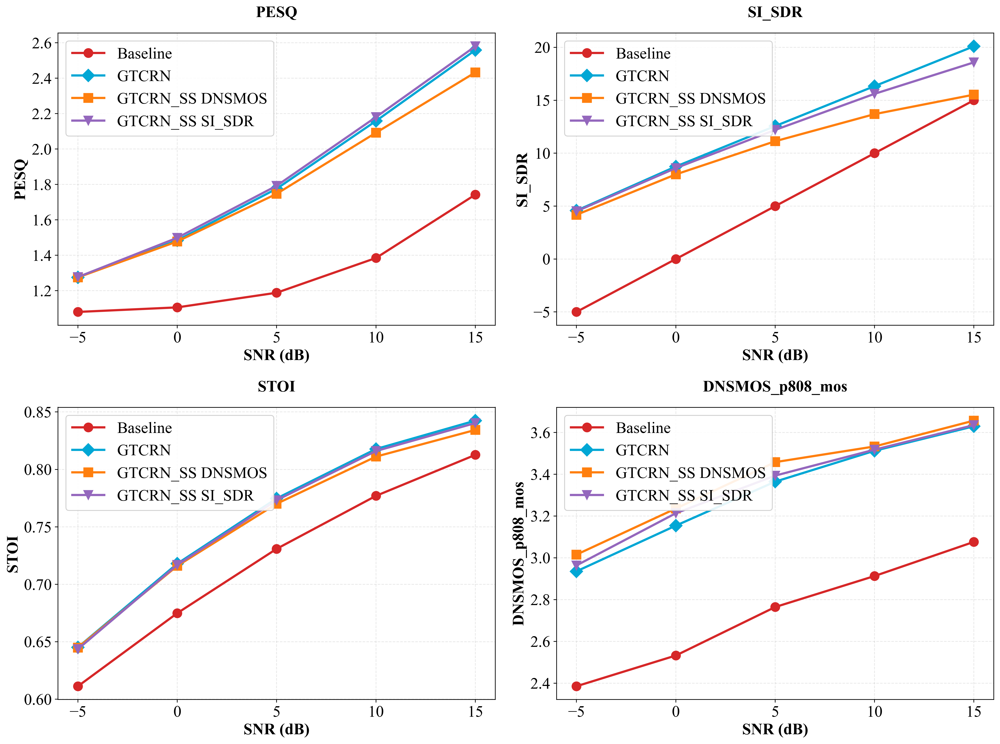

✓ Comparison plots saved!

Calculating improvements...

Improvement Summary (%):
          PESQ GTCRN vs Baseline (%)  SI_SDR GTCRN vs Baseline (%)  \
SNR (dB)                                                             
-5                             18.04                       -191.45   
 0                             34.19                   -1731986.07   
 5                             49.42                        151.44   
 10                            55.89                         63.40   
 15                            46.85                         33.98   

          STOI GTCRN vs Baseline (%)  DNSMOS_p808_mos GTCRN vs Baseline (%)  \
SNR (dB)                                                                      
-5                              5.54                                  23.06   
 0                              6.39                                  24.55   
 5                              6.00                                  21.71   
 10                             5

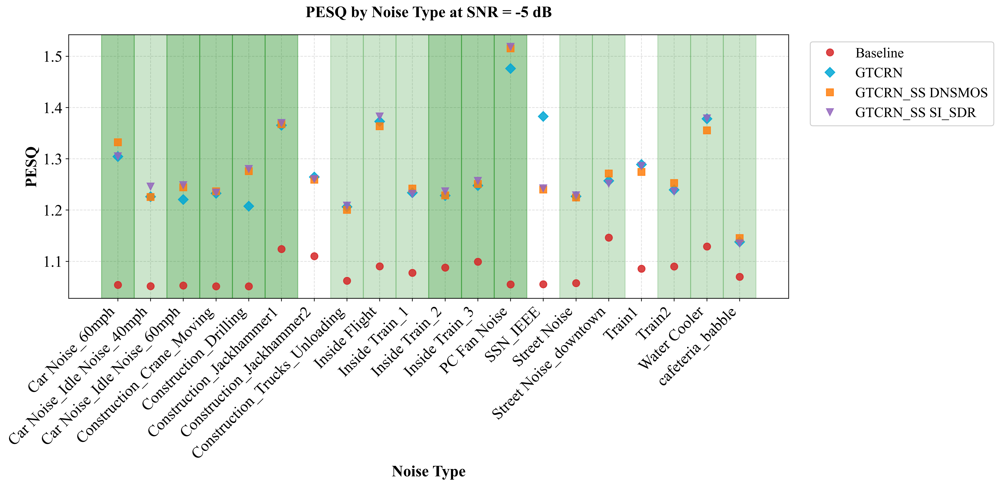

✓ Saved: GTCRN_SS_per_noise_SNR-5dB_PESQ_comparison.png


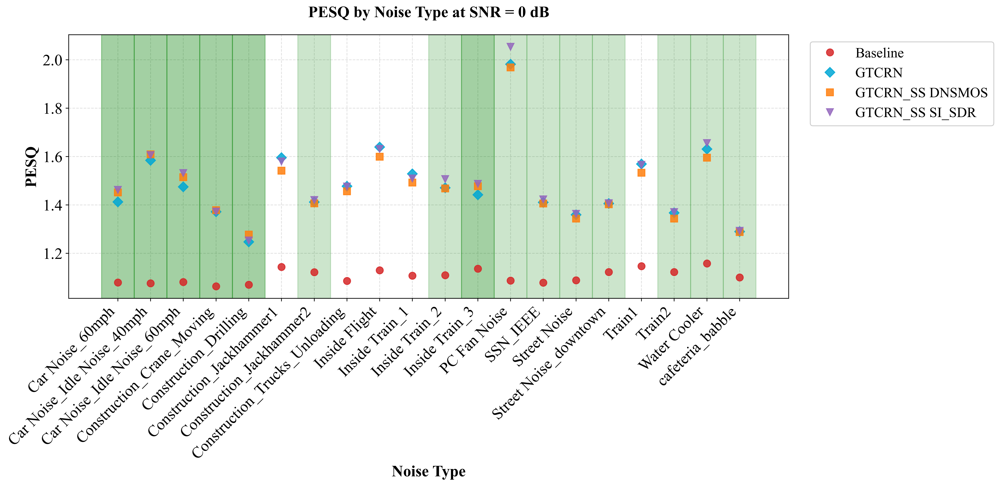

✓ Saved: GTCRN_SS_per_noise_SNR0dB_PESQ_comparison.png


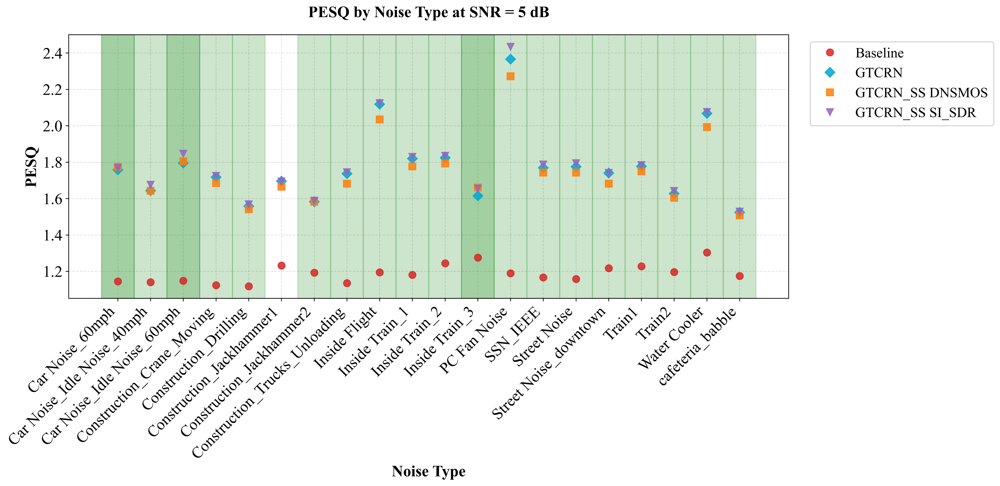

✓ Saved: GTCRN_SS_per_noise_SNR5dB_PESQ_comparison.png

Analyzing SI_SDR performance by noise type...


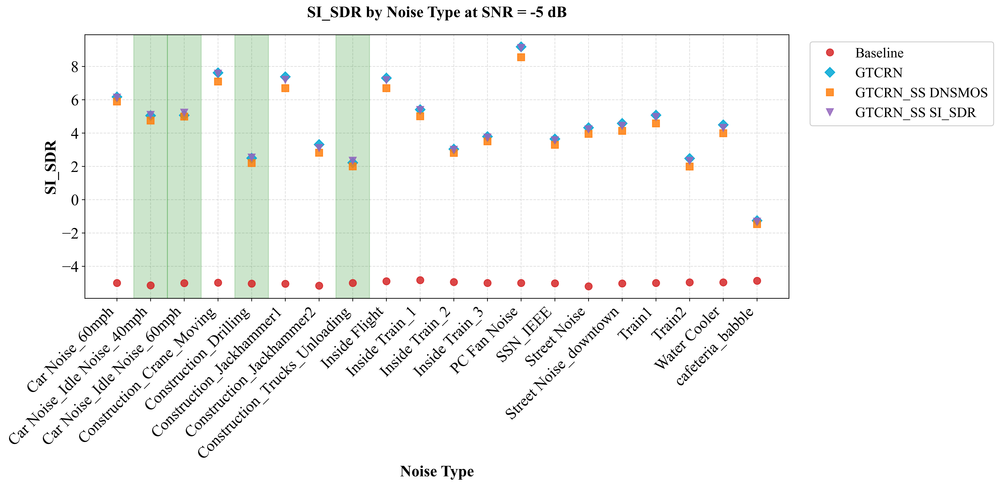

✓ Saved: GTCRN_SS_per_noise_SNR-5dB_SI_SDR_comparison.png


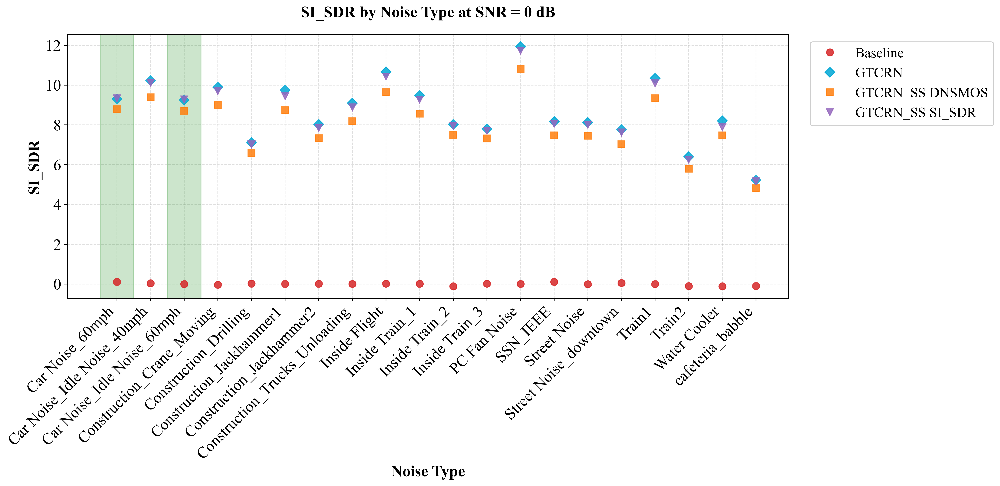

✓ Saved: GTCRN_SS_per_noise_SNR0dB_SI_SDR_comparison.png


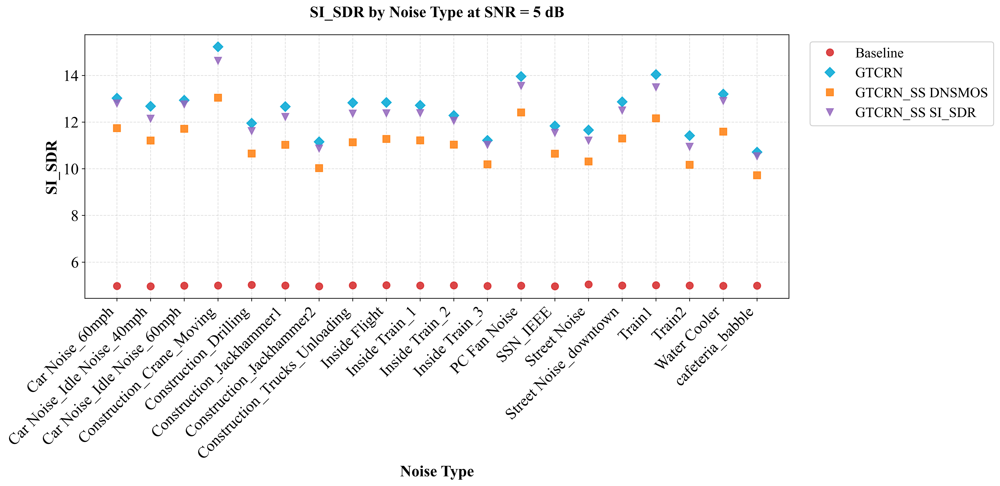

✓ Saved: GTCRN_SS_per_noise_SNR5dB_SI_SDR_comparison.png

Analyzing STOI performance by noise type...


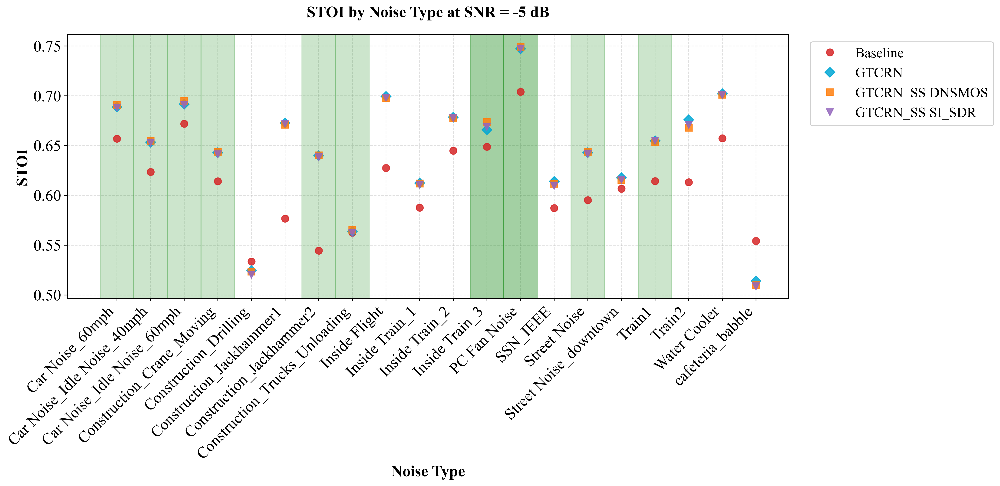

✓ Saved: GTCRN_SS_per_noise_SNR-5dB_STOI_comparison.png


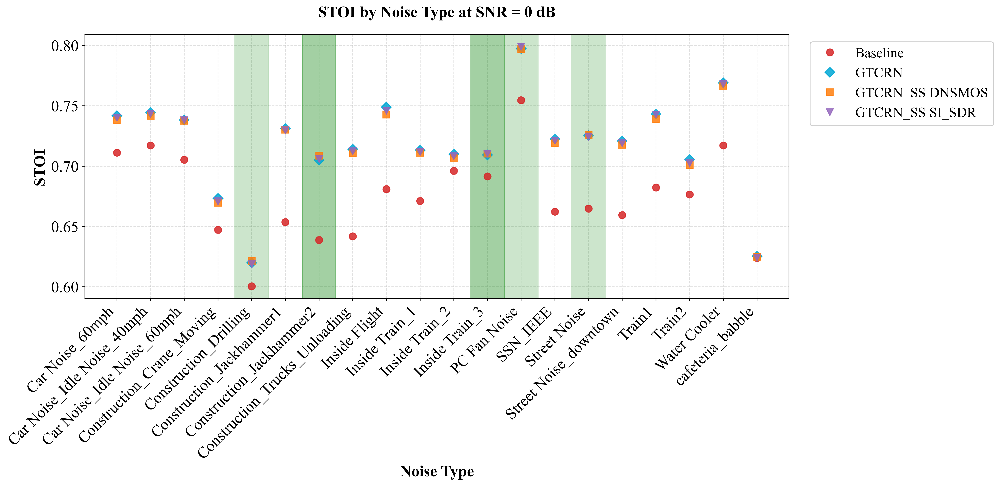

✓ Saved: GTCRN_SS_per_noise_SNR0dB_STOI_comparison.png


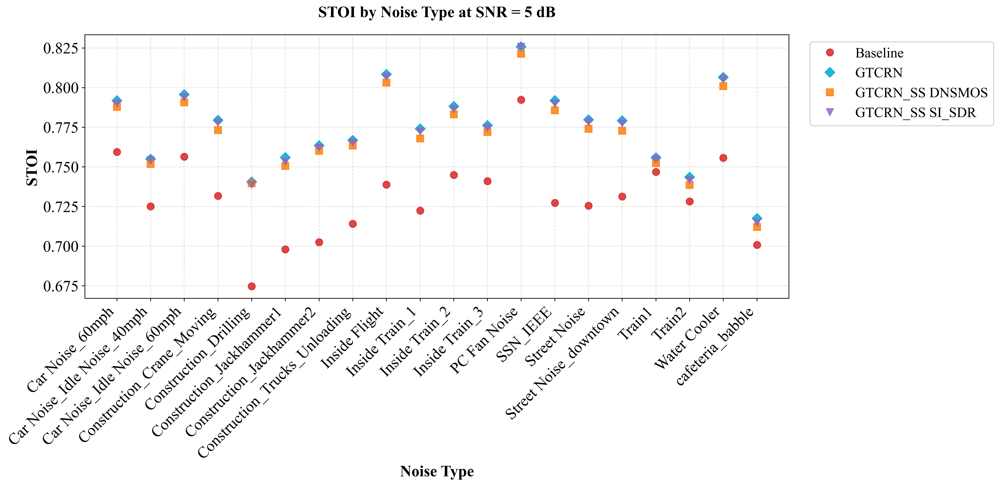

✓ Saved: GTCRN_SS_per_noise_SNR5dB_STOI_comparison.png

Analyzing DNSMOS_p808_mos performance by noise type...


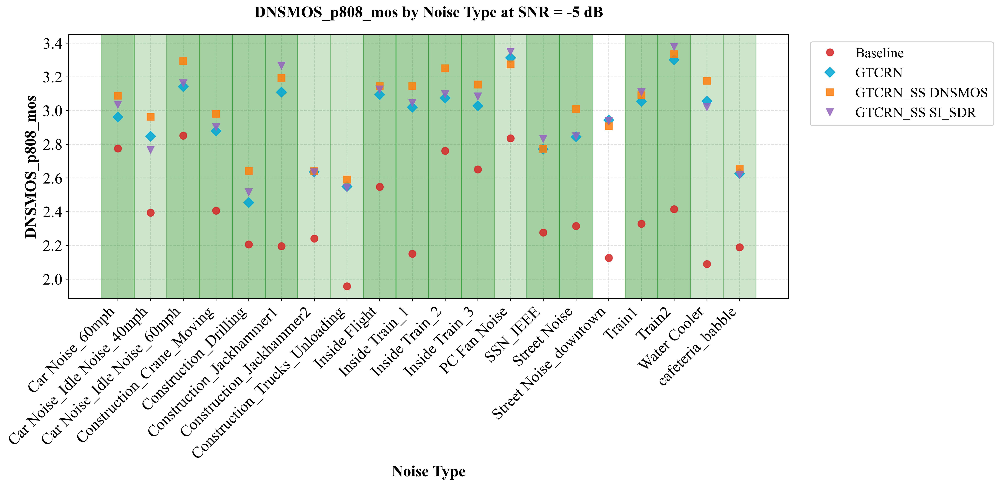

✓ Saved: GTCRN_SS_per_noise_SNR-5dB_DNSMOS_p808_mos_comparison.png


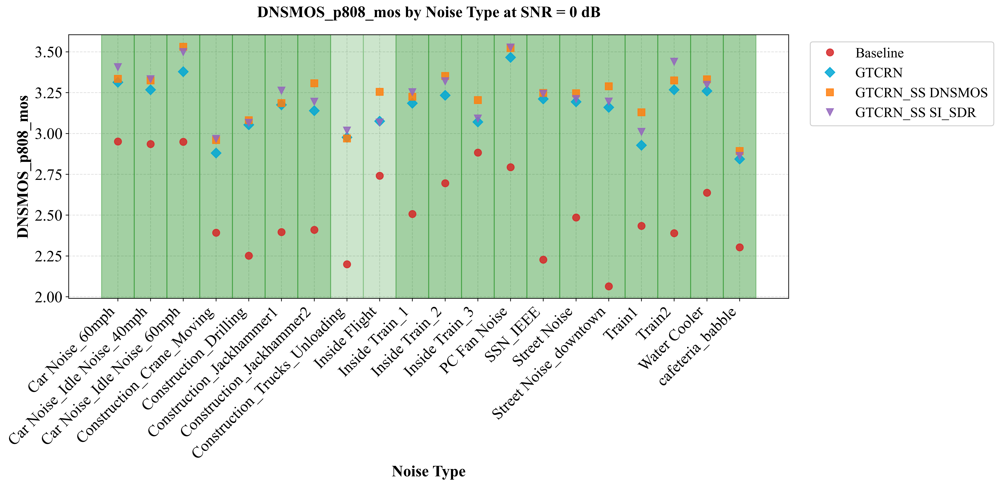

✓ Saved: GTCRN_SS_per_noise_SNR0dB_DNSMOS_p808_mos_comparison.png


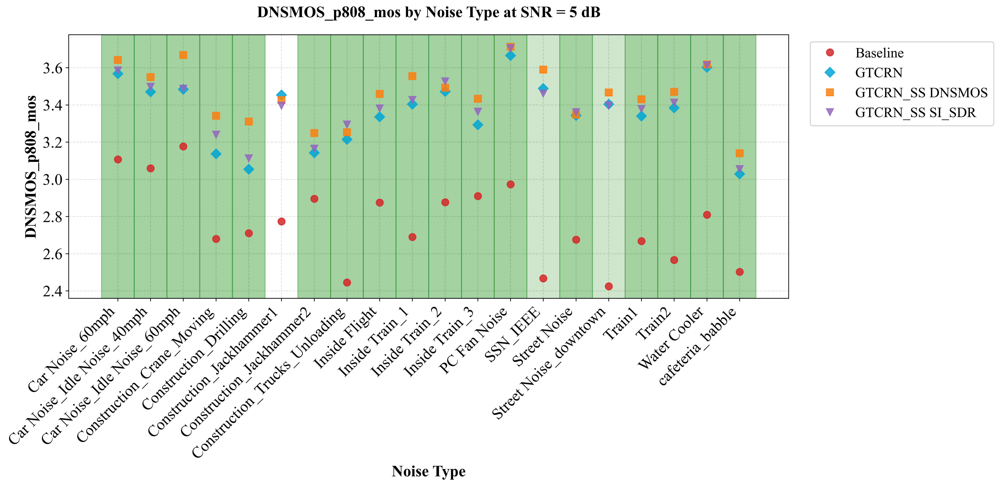

✓ Saved: GTCRN_SS_per_noise_SNR5dB_DNSMOS_p808_mos_comparison.png

NOISE TYPE BENEFIT ANALYSIS (vs GTCRN)

SNR = -5 dB - Noise Types Ranked by Improvement over GTCRN

Baseline Configuration:
----------------------------------------------------------------------------------------------------

  PESQ:
    1. cafeteria_babble    :   -5.98%
    2. Street Noise_downtown:   -8.81%
    3. Inside Train_2      :  -11.44%
    4. Inside Train_3      :  -11.89%
    5. Construction_Trucks_Unloading:  -11.96%
    6. Train2              :  -12.04%
    7. Construction_Jackhammer2:  -12.21%
    8. Inside Train_1      :  -12.66%
    9. Construction_Drilling:  -12.95%
    10. Car Noise_Idle Noise_60mph:  -13.75%
    11. Street Noise        :  -13.81%
    12. Car Noise_Idle Noise_40mph:  -14.24%
    13. Construction_Crane_Moving:  -14.72%
    14. Train1              :  -15.76%
    15. Construction_Jackhammer1:  -17.68%
    16. Water Cooler        :  -18.07%
    17. Car Noise_60mph     :  -19.19%
    18. I

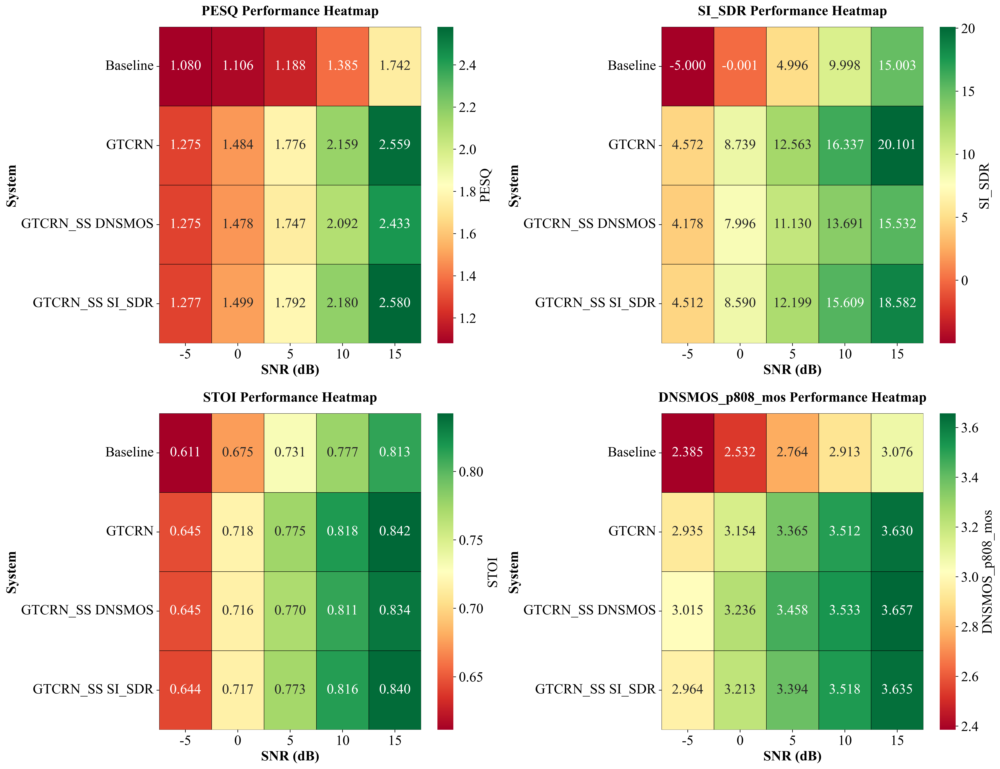

✓ Heatmap visualization saved!

EXPORTING ALL ANALYSIS RESULTS
✓ Exported: comparison_PESQ.csv
✓ Exported: comparison_SI_SDR.csv
✓ Exported: comparison_STOI.csv
✓ Exported: comparison_DNSMOS_p808_mos.csv

✓ All results exported to: c:\Users\gabi\Documents\University\Uni2025\Investigation\PROJECT-25P85\DATA_ANALYSIS\SS\GTCRN_SS_hybrid\GTCRN_SS_comparison

GTCRN SPECTRAL SUBTRACTION: FINAL SUMMARY

EXPERIMENT OVERVIEW:
----------------------------------------------------------------------------------------------------
• Method: GTCRN-based Spectral Subtraction
• Configurations: GTCRN, GTCRN_SS DNSMOS, GTCRN_SS SI_SDR
• Frame Duration: 20ms with 75% overlap
• Filter Length: 8, N=4 iterations
• SNR Levels: [-5, 0, 5, 10, 15] dB
• Metrics: PESQ, SI_SDR, STOI, DNSMOS_p808_mos

KEY FINDINGS:
----------------------------------------------------------------------------------------------------
✓ GTCRN_SS SI_SDR outperforms GTCRN_SS DNSMOS on 3/4 metrics
  PESQ: GTCRN_SS SI_SDR vs GTCRN: +0.83%
 

In [8]:
# ============================================================================
# MAIN EXECUTION
# ============================================================================

if __name__ == "__main__":
    # Check directories
    check_directories()
    
    # Load all data
    comparison_dfs = load_all_data()
    
    # Generate plots
    plot_performance_comparison(comparison_dfs)
    
    # Calculate improvements (vs Baseline by default)
    calculate_improvements(comparison_dfs, baseline_name='Baseline')
    
    # Per-noise type analysis
    plot_per_noise_type(snr_subset=[-5, 0, 5], metric_name='PESQ')
    plot_per_noise_type(snr_subset=[-5, 0, 5], metric_name='SI_SDR')
    plot_per_noise_type(snr_subset=[-5, 0, 5], metric_name='STOI')
    plot_per_noise_type(snr_subset=[-5, 0, 5], metric_name='DNSMOS_p808_mos')
    
    # Noise type benefit analysis (vs GTCRN)
    analyze_noise_type_benefits(snr_subset=[-5, 0, 5], reference_system='GTCRN')
    
    # Statistical summary
    print_statistical_summary(comparison_dfs, reference_system='GTCRN')
    
    # Generate heatmaps
    plot_heatmaps(comparison_dfs)
    
    # Export results
    export_all_results(comparison_dfs)
    
    # Final summary
    print_final_summary(comparison_dfs, reference_system='GTCRN')